This colab has an [accompanying video](https://www.youtube.com/watch?v=o6JNHoGUXCo)

In [1]:
import itertools as it
from matplotlib import pyplot as plt
import numpy as np
import pyspiel

from open_spiel.python.algorithms import exploitability
from open_spiel.python import policy as policy_lib

np.set_printoptions(precision=3, suppress=True, floatmode='fixed')

# Independent Q-learning training

In [5]:
from open_spiel.python import rl_environment
from open_spiel.python.algorithms import tabular_qlearner

game = pyspiel.load_game("kuhn_poker")
env = rl_environment.Environment(game=game)

# initialize agents
agent0 = tabular_qlearner.QLearner(0, game.num_distinct_actions())
agent1 = tabular_qlearner.QLearner(1, game.num_distinct_actions())
agent2 = tabular_qlearner.QLearner(2, game.num_distinct_actions())
agent3 = tabular_qlearner.QLearner(3, game.num_distinct_actions())
AGENTS = [agent0, agent1, agent2, agent3]

In [15]:
# train agents
import pyspiel
from open_spiel.python import rl_environment
from open_spiel.python.algorithms import tabular_qlearner

# Create an environment for the game
game_name = "tic_tac_toe"  # Replace with your game
num_players = 2
game = pyspiel.load_game(game_name)
env = rl_environment.Environment(game)
num_actions = env.action_spec()["num_actions"]

# Create 4 Q-Learner agents
agents = [
    tabular_qlearner.QLearner(player_id=idx, num_actions=num_actions)
    for idx in range(num_players)
]



agents

In [16]:

train_episodes = 1000
# 1. Train the agents
for cur_episode in range(train_episodes):
# if cur_episode % int(1e4) == 0:
#     win_rates = eval_against_random_bots(env, agents, random_agents, 1000)
#     logging.info("Starting episode %s, win_rates %s", cur_episode, win_rates)
    time_step = env.reset()
    while not time_step.last():
        player_id = time_step.observations["current_player"]
        agent_output = agents[player_id].step(time_step)
        time_step = env.step([agent_output.action])

# Episode is over, step all agents with final info state.
for agent in agents:
    agent.step(time_step)

TypeError: 'NoneType' object is not subscriptable

# CFR

In [2]:
game = pyspiel.load_game('python_tiny_dominoes')
state = game.new_initial_state()

print(state)
while not state.is_terminal():
  action = np.random.choice(state.legal_actions())
  print(f'Taking action {action} {state.action_to_string(action)}')
  state.apply_action(action)
  print(state)
print(f'Game over; returns {state.returns()}')

hand0:[]
hand1:[]
hand2:[]
hand3:[]

board: []
Taking action 3 Deal (0.0, 3.0)
hand0:['(0.0, 3.0)']
hand1:[]
hand2:[]
hand3:[]

board: []
Taking action 0 Deal (0.0, 0.0)
hand0:['(0.0, 3.0)']
hand1:['(0.0, 0.0)']
hand2:[]
hand3:[]

board: []
Taking action 7 Deal (2.0, 2.0)
hand0:['(0.0, 3.0)']
hand1:['(0.0, 0.0)']
hand2:['(2.0, 2.0)']
hand3:[]

board: []
Taking action 4 Deal (1.0, 1.0)
hand0:['(0.0, 3.0)']
hand1:['(0.0, 0.0)']
hand2:['(2.0, 2.0)']
hand3:['(1.0, 1.0)']

board: []
Taking action 2 Deal (0.0, 2.0)
hand0:['(0.0, 3.0)', '(0.0, 2.0)']
hand1:['(0.0, 0.0)']
hand2:['(2.0, 2.0)']
hand3:['(1.0, 1.0)']

board: []
Taking action 5 Deal (1.0, 2.0)
hand0:['(0.0, 3.0)', '(0.0, 2.0)']
hand1:['(0.0, 0.0)', '(1.0, 2.0)']
hand2:['(2.0, 2.0)']
hand3:['(1.0, 1.0)']

board: []
Taking action 6 Deal (1.0, 3.0)
hand0:['(0.0, 3.0)', '(0.0, 2.0)']
hand1:['(0.0, 0.0)', '(1.0, 2.0)']
hand2:['(2.0, 2.0)', '(1.0, 3.0)']
hand3:['(1.0, 1.0)']

board: []
Taking action 1 Deal (0.0, 1.0)
hand0:['(0.0, 2.0)',

In [3]:
print(game.get_type().pretty_print())

short_name: python_tiny_dominoes
long_name: Python Tiny Dominoes (4 players)
dynamics: Sequential
chance_mode: ExplicitStochastic
information: ImperfectInformation
utility: ZeroSum
reward_model: Terminal
max_num_players: 4
min_num_players: 4
provides_information_state_string: true
provides_information_state_tensor: true
provides_observation_string: true
provides_observation_tensor: true
provides_factored_observation_string: true
parameter_specification: 


In [4]:
policy = policy_lib.TabularPolicy(game)
print(policy.states_per_player)
print(policy.action_probability_array)

[['p0 hand:[(0.0, 0.0), (1.0, 1.0)] history:[]', 'p0 hand:[(1.0, 1.0)] history:[p0 tile:(0.0, 0.0) pip:None, p1 tile:(0.0, 1.0) pip:0.0, p2 tile:(0.0, 2.0) pip:0.0, p3 tile:(2.0, 2.0) pip:2.0]', 'p0 hand:[(0.0, 0.0)] history:[p0 tile:(1.0, 1.0) pip:None, p1 tile:(0.0, 1.0) pip:1.0, p2 tile:(1.0, 3.0) pip:1.0, p3 tile:(0.0, 3.0) pip:3.0]', 'p0 hand:[(0.0, 0.0)] history:[p0 tile:(1.0, 1.0) pip:None, p1 tile:(1.0, 2.0) pip:1.0, p2 tile:(1.0, 3.0) pip:1.0, p3 tile:(0.0, 3.0) pip:3.0]', 'p0 hand:[(0.0, 0.0)] history:[p0 tile:(1.0, 1.0) pip:None, p1 tile:(1.0, 2.0) pip:1.0, p2 tile:(0.0, 2.0) pip:2.0, p3 tile:(1.0, 3.0) pip:1.0]', 'p0 hand:[(0.0, 0.0)] history:[p0 tile:(1.0, 1.0) pip:None, p1 tile:(0.0, 1.0) pip:1.0, p2 tile:(1.0, 2.0) pip:1.0, p3 tile:(2.0, 2.0) pip:2.0]', 'p0 hand:[(0.0, 0.0)] history:[p0 tile:(1.0, 1.0) pip:None, p1 tile:(1.0, 3.0) pip:1.0, p2 tile:(1.0, 2.0) pip:1.0, p3 tile:(0.0, 3.0) pip:3.0]', 'p0 hand:[(1.0, 1.0)] history:[p0 tile:(0.0, 0.0) pip:None, p1 tile:(0.0, 1

In [5]:
def print_policy(policy):
  for state, probs in zip(it.chain(*policy.states_per_player),
                          policy.action_probability_array):
    print(f'{state:6}   p={probs}')

print_policy(policy)

p0 hand:[(0.0, 0.0), (1.0, 1.0)] history:[]   p=[0.500 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.500
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000]
p0 hand:[(1.0, 1.0)] history:[p0 tile:(0.0, 0.0) pip:None, p1 tile:(0.0, 1.0) pip:0.0, p2 tile:(0.0, 2.0) pip:0.0, p3 tile:(2.0, 2.0) pip:2.0]   p=[0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 1.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 

In [6]:
print(exploitability.nash_conv(game, policy))

2.4095458553791884


In [7]:
def new_reach(so_far, player, action_prob):
  """Returns new reach probabilities."""
  new = np.array(so_far)
  new[player] *= action_prob
  return new

def calc_cfr(state, reach):
  """Updates regrets; returns utility for all players."""
  if state.is_terminal():
    return state.returns()
  elif state.is_chance_node():
    return sum(prob * calc_cfr(state.child(action), new_reach(reach, -1, prob))
               for action, prob in state.chance_outcomes())
  else:
    # We are at a player decision point.
    player = state.current_player()
    index = policy.state_index(state)
    
    # Compute utilities after each action, updating regrets deeper in the tree.
    utility = np.zeros((game.num_distinct_actions(), game.num_players()))
    for action in state.legal_actions():
      prob = curr_policy[index][action]
      utility[action] = calc_cfr(state.child(action), new_reach(reach, player, prob))

    # Compute regrets at this state.
    cfr_prob = np.prod(reach[:player]) * np.prod(reach[player+1:])
    value = np.einsum('ap,a->p', utility, curr_policy[index])
    for action in state.legal_actions():
      regrets[index][action] += cfr_prob * (utility[action][player] - value[player])

    # Return the value of this state for all players.
    return value

main game loop

In [8]:
game = pyspiel.load_game('python_tiny_dominoes')
# game = pyspiel.load_game('turn_based_simultaneous_game(game=goofspiel(imp_info=true,num_cards=4,players=2,points_order=descending))')
policy = policy_lib.TabularPolicy(game)
initial_state = game.new_initial_state()
curr_policy = policy.action_probability_array.copy()
regrets = np.zeros_like(policy.action_probability_array)
eval_steps = []
eval_nash_conv = []
for step in range(100):
  # Compute regrets
  calc_cfr(initial_state, np.ones(1 + game.num_players()))

  # Find the new regret-matching policy
  floored_regrets = np.maximum(regrets, 1e-16)
  sum_floored_regrets = np.sum(floored_regrets, axis=1, keepdims=True)
  curr_policy = floored_regrets / sum_floored_regrets

  # Update the average policy
  lr = 1 / (1 + step)
  policy.action_probability_array *= (1 - lr)
  policy.action_probability_array += curr_policy * lr

  # Evaluate the average policy
  if step & (step-1) == 0:
    nc = exploitability.nash_conv(game, policy)
    eval_steps.append(step)
    eval_nash_conv.append(nc)
    print(f'Nash conv after step {step} is {nc}')

Nash conv after step 0 is 0.5131393202107734
Nash conv after step 1 is -0.08286569179211861
Nash conv after step 2 is -0.4553737228441141
Nash conv after step 4 is -0.809596891957101
Nash conv after step 8 is -1.0720730324458976
Nash conv after step 16 is -1.287686910808798
Nash conv after step 32 is -1.4929304512018247
Nash conv after step 64 is -1.610883103079437


/var/folders/0m/z88x3c1j7xd4l72t8djyymyh0000gn/T/ipykernel_79042/1285772792.py:4: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


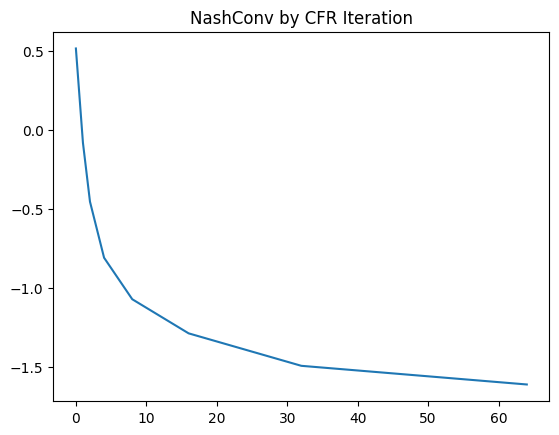

In [9]:
fig, ax = plt.subplots()
ax.set_title("NashConv by CFR Iteration")
ax.plot(eval_steps, eval_nash_conv)
fig.show()

/var/folders/0m/z88x3c1j7xd4l72t8djyymyh0000gn/T/ipykernel_79042/3744611508.py:4: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


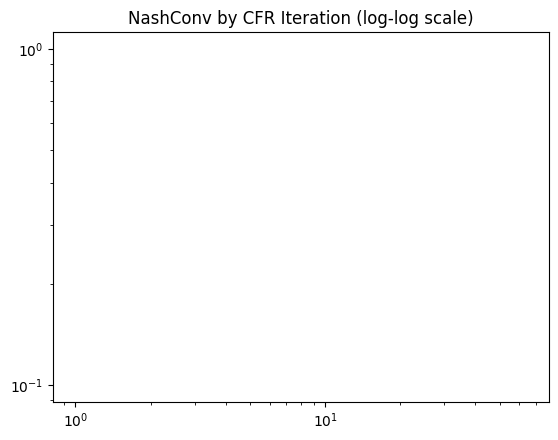

In [10]:
fig, ax = plt.subplots()
ax.set_title("NashConv by CFR Iteration (log-log scale)")
ax.loglog(eval_steps, eval_nash_conv)
fig.show()

In [11]:
# Display the whole policy
print_policy(policy)

# How likely are we to .... ? exploration of the learned policy

p0 hand:[(0.0, 0.0), (1.0, 1.0)] history:[]   p=[0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 1.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000]
p0 hand:[(1.0, 1.0)] history:[p0 tile:(0.0, 0.0) pip:None, p1 tile:(0.0, 1.0) pip:0.0, p2 tile:(0.0, 2.0) pip:0.0, p3 tile:(2.0, 2.0) pip:2.0]   p=[0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011
 0.106 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011
 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011
 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011 0.011
 

# REINFORCE

In [ ]:
def sample(actions_and_probs):
  actions, probs = zip(*actions_and_probs)
  return np.random.choice(actions, p=probs)

def policy_as_list(policy, state):
  return list(enumerate(policy.policy_for_key(state.information_state_string())))

def env_action(state):
  if state.is_chance_node():
    p = state.chance_outcomes()
  else:
    p = policy_as_list(fixed_policy, state)
  return sample(p)

def softmax(x):
  x = np.exp(x - np.max(x, axis=-1, keepdims=True))
  return x / np.sum(x, axis=-1, keepdims=True)

def generate_trajectory(state, player):
  trajectory = []
  while not state.is_terminal():
    if state.current_player() == player:
      action = sample(policy_as_list(rl_policy, state))
      trajectory.append((rl_policy.state_index(state), action))
    else:
      action = env_action(state)
    state.apply_action(action)
  return trajectory, state.returns()[player]


In [ ]:
fixed_policy = policy_lib.TabularPolicy(game)
rl_policy = policy_lib.TabularPolicy(game)
for _ in range(5):
  print(generate_trajectory(game.new_initial_state(), player=0))

In [ ]:
# Run REINFORCE
N = 10000
lr = 0.01
for step in range(N):
  for player in (0, 1):
    trajectory, reward = generate_trajectory(game.new_initial_state(), player)
    for s, a in trajectory:
      logits = np.log(rl_policy.action_probability_array[s])
      logits[a] += lr * reward
      rl_policy.action_probability_array[s] = softmax(logits)

In [ ]:
# Evaluate the policy
def evaluate(state, rl_policy, player):
  if state.is_terminal():
    return state.returns()[player]
  elif state.current_player() == player:
    ap = policy_as_list(rl_policy, state)
  elif state.is_chance_node():
    ap = state.chance_outcomes()
  else:
    ap = policy_as_list(fixed_policy, state)
  return sum(p * evaluate(state.child(a), rl_policy, player) for a, p in ap)

def eval(rl_policy):
  return (evaluate(game.new_initial_state(), rl_policy, player=0)
        + evaluate(game.new_initial_state(), rl_policy, player=1))

print_policy(rl_policy)
eval(rl_policy)

In [ ]:
# Evaluate the greedy policy
greedy_policy = policy_lib.TabularPolicy(game)
greedy_policy.action_probability_array = (np.eye(game.num_distinct_actions())
              [np.argmax(rl_policy.action_probability_array, axis=-1)])

print_policy(greedy_policy)
eval(greedy_policy)